In [1]:
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

In [2]:
import os
import numpy as np
np.random.seed(777)
import math
import keras
import keras.backend as K
import h5py
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam, SGD, RMSprop
from keras.models import Sequential
from keras.models import Model
from keras.layers import Input, Activation, merge, Dense, Flatten, Dropout
from keras.layers.convolutional import Conv2D, MaxPooling2D
from keras.layers import BatchNormalization, add, GlobalAveragePooling2D
from keras.utils.np_utils import to_categorical
from keras.optimizers import Adam
from sklearn.metrics import accuracy_score,roc_curve, confusion_matrix, roc_auc_score, auc, f1_score
from keras.regularizers import l2

import keras
from keras import layers
from keras.layers import Input, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, Lambda,Concatenate
from keras.layers import SeparableConv2D, AveragePooling2D, MaxPooling2D, Dropout, GlobalMaxPooling2D, GlobalAveragePooling2D, Add

import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams["axes.grid"] = False
plt.rcParams.update({'font.size': 20})

Using TensorFlow backend.


In [3]:
train_dir = 'data/train/'
test_dir = 'data/test/'

In [4]:
import keras
import tensorflow as tf
import keras.backend as K

print("Keras Version", keras.__version__)
print("tensorflow Version", tf.__version__)
print("dim_ordering:", K.image_dim_ordering())

Keras Version 2.2.4
tensorflow Version 1.10.0
dim_ordering: tf


In [5]:
for root,dirs,files in os.walk(train_dir):
    print (root, len(files))

print("*"*30)
for root,dirs,files in os.walk(test_dir):
    print (root, len(files))

data/train/ 0
data/train/AKIEC 34704
data/train/BCC 19092
data/train/BKL 13100
data/train/DF 16608
data/train/MEL 13232
data/train/NV 19900
data/train/VASC 6976
******************************
data/test/ 0
data/test/AKIEC 74
data/test/BCC 139
data/test/BKL 284
data/test/DF 30
data/test/MEL 312
data/test/NV 1730
data/test/VASC 33


_____

In [6]:
error_list = ['AKIEC\ISIC_0025029.jpg',
'AKIEC\ISIC_0026720.jpg',
'AKIEC\ISIC_0026848.jpg',
'AKIEC\ISIC_0026984.jpg',
'AKIEC\ISIC_0027184.jpg',
'AKIEC\ISIC_0027303.jpg',
'AKIEC\ISIC_0027334.jpg',
'AKIEC\ISIC_0028820.jpg',
'AKIEC\ISIC_0031043.jpg',
'AKIEC\ISIC_0031738.jpg',
'BCC\ISIC_0024454.jpg',
'BCC\ISIC_0026074.jpg',
'BCC\ISIC_0026439.jpg',
'BCC\ISIC_0026453.jpg',
'BCC\ISIC_0026656.jpg',
'BCC\ISIC_0027744.jpg',
'BCC\ISIC_0028079.jpg',
'BCC\ISIC_0028168.jpg',
'BCC\ISIC_0028670.jpg',
'BCC\ISIC_0028688.jpg',
'BCC\ISIC_0028818.jpg',
'BCC\ISIC_0029545.jpg',
'BCC\ISIC_0030314.jpg',
'BCC\ISIC_0030594.jpg',
'BCC\ISIC_0030868.jpg',
'BCC\ISIC_0031009.jpg',
'BCC\ISIC_0031258.jpg',
'BCC\ISIC_0033354.jpg',
'BCC\ISIC_0033579.jpg',
'BKL\ISIC_0024505.jpg',
'BKL\ISIC_0024635.jpg',
'BKL\ISIC_0024696.jpg',
'BKL\ISIC_0024782.jpg',
'BKL\ISIC_0024893.jpg',
'BKL\ISIC_0025063.jpg',
'BKL\ISIC_0025103.jpg',
'BKL\ISIC_0025366.jpg',
'BKL\ISIC_0025693.jpg',
'BKL\ISIC_0026085.jpg',
'BKL\ISIC_0026139.jpg',
'BKL\ISIC_0026523.jpg',
'BKL\ISIC_0026553.jpg',
'BKL\ISIC_0027192.jpg',
'BKL\ISIC_0027239.jpg',
'BKL\ISIC_0028294.jpg',
'BKL\ISIC_0028309.jpg',
'BKL\ISIC_0028386.jpg',
'BKL\ISIC_0028404.jpg',
'BKL\ISIC_0028611.jpg',
'BKL\ISIC_0028615.jpg',
'BKL\ISIC_0028913.jpg',
'BKL\ISIC_0028970.jpg',
'BKL\ISIC_0029345.jpg',
'BKL\ISIC_0029683.jpg',
'BKL\ISIC_0029849.jpg',
'BKL\ISIC_0029924.jpg',
'BKL\ISIC_0030056.jpg',
'BKL\ISIC_0030768.jpg',
'BKL\ISIC_0030783.jpg',
'BKL\ISIC_0031600.jpg',
'BKL\ISIC_0031853.jpg',
'BKL\ISIC_0032103.jpg',
'BKL\ISIC_0032306.jpg',
'BKL\ISIC_0032827.jpg',
'BKL\ISIC_0032949.jpg',
'BKL\ISIC_0033041.jpg',
'BKL\ISIC_0033507.jpg',
'BKL\ISIC_0033606.jpg',
'BKL\ISIC_0033613.jpg',
'BKL\ISIC_0033716.jpg',
'DF\ISIC_0024330.jpg',
'MEL\ISIC_0024792.jpg',
'MEL\ISIC_0024918.jpg',
'MEL\ISIC_0025439.jpg',
'MEL\ISIC_0025500.jpg',
'MEL\ISIC_0025674.jpg',
'MEL\ISIC_0025751.jpg',
'MEL\ISIC_0025835.jpg',
'MEL\ISIC_0026596.jpg',
'MEL\ISIC_0026892.jpg',
'MEL\ISIC_0027043.jpg',
'MEL\ISIC_0027102.jpg',
'MEL\ISIC_0027517.jpg',
'MEL\ISIC_0027616.jpg',
'MEL\ISIC_0028065.jpg',
'MEL\ISIC_0028582.jpg',
'MEL\ISIC_0029453.jpg',
'MEL\ISIC_0029570.jpg',
'MEL\ISIC_0030031.jpg',
'MEL\ISIC_0030333.jpg',
'MEL\ISIC_0030391.jpg',
'MEL\ISIC_0031369.jpg',
'MEL\ISIC_0031494.jpg',
'MEL\ISIC_0031745.jpg',
'MEL\ISIC_0032810.jpg',
'MEL\ISIC_0032833.jpg',
'MEL\ISIC_0033089.jpg',
'MEL\ISIC_0033245.jpg',
'MEL\ISIC_0033310.jpg',
'MEL\ISIC_0033728.jpg',
'MEL\ISIC_0033813.jpg',
'MEL\ISIC_0034012.jpg',
'NV\ISIC_0024314.jpg',
'NV\ISIC_0024458.jpg',
'NV\ISIC_0024480.jpg',
'NV\ISIC_0024524.jpg',
'NV\ISIC_0024596.jpg',
'NV\ISIC_0024615.jpg',
'NV\ISIC_0024690.jpg',
'NV\ISIC_0024723.jpg',
'NV\ISIC_0024725.jpg',
'NV\ISIC_0024734.jpg',
'NV\ISIC_0024752.jpg',
'NV\ISIC_0024818.jpg',
'NV\ISIC_0024827.jpg',
'NV\ISIC_0024857.jpg',
'NV\ISIC_0024899.jpg',
'NV\ISIC_0024937.jpg',
'NV\ISIC_0024996.jpg',
'NV\ISIC_0025043.jpg',
'NV\ISIC_0025051.jpg',
'NV\ISIC_0025108.jpg',
'NV\ISIC_0025123.jpg',
'NV\ISIC_0025146.jpg',
'NV\ISIC_0025239.jpg',
'NV\ISIC_0025295.jpg',
'NV\ISIC_0025352.jpg',
'NV\ISIC_0025372.jpg',
'NV\ISIC_0025402.jpg',
'NV\ISIC_0025421.jpg',
'NV\ISIC_0025443.jpg',
'NV\ISIC_0025568.jpg',
'NV\ISIC_0025638.jpg',
'NV\ISIC_0025742.jpg',
'NV\ISIC_0025865.jpg',
'NV\ISIC_0025918.jpg',
'NV\ISIC_0025966.jpg',
'NV\ISIC_0025967.jpg',
'NV\ISIC_0026049.jpg',
'NV\ISIC_0026052.jpg',
'NV\ISIC_0026076.jpg',
'NV\ISIC_0026123.jpg',
'NV\ISIC_0026124.jpg',
'NV\ISIC_0026126.jpg',
'NV\ISIC_0026148.jpg',
'NV\ISIC_0026209.jpg',
'NV\ISIC_0026370.jpg',
'NV\ISIC_0026374.jpg',
'NV\ISIC_0026382.jpg',
'NV\ISIC_0026387.jpg',
'NV\ISIC_0026401.jpg',
'NV\ISIC_0026404.jpg',
'NV\ISIC_0026406.jpg',
'NV\ISIC_0026414.jpg',
'NV\ISIC_0026429.jpg',
'NV\ISIC_0026445.jpg',
'NV\ISIC_0026451.jpg',
'NV\ISIC_0026454.jpg',
'NV\ISIC_0026501.jpg',
'NV\ISIC_0026541.jpg',
'NV\ISIC_0026551.jpg',
'NV\ISIC_0026559.jpg',
'NV\ISIC_0026573.jpg',
'NV\ISIC_0026577.jpg',
'NV\ISIC_0026592.jpg',
'NV\ISIC_0026638.jpg',
'NV\ISIC_0026671.jpg',
'NV\ISIC_0026739.jpg',
'NV\ISIC_0026751.jpg',
'NV\ISIC_0026819.jpg',
'NV\ISIC_0026830.jpg',
'NV\ISIC_0027003.jpg',
'NV\ISIC_0027005.jpg',
'NV\ISIC_0027007.jpg',
'NV\ISIC_0027020.jpg',
'NV\ISIC_0027024.jpg',
'NV\ISIC_0027052.jpg',
'NV\ISIC_0027114.jpg',
'NV\ISIC_0027183.jpg',
'NV\ISIC_0027199.jpg',
'NV\ISIC_0027237.jpg',
'NV\ISIC_0027298.jpg',
'NV\ISIC_0027311.jpg',
'NV\ISIC_0027358.jpg',
'NV\ISIC_0027423.jpg',
'NV\ISIC_0027444.jpg',
'NV\ISIC_0027466.jpg',
'NV\ISIC_0027567.jpg',
'NV\ISIC_0027569.jpg',
'NV\ISIC_0027578.jpg',
'NV\ISIC_0027627.jpg',
'NV\ISIC_0027662.jpg',
'NV\ISIC_0027667.jpg',
'NV\ISIC_0027671.jpg',
'NV\ISIC_0027718.jpg',
'NV\ISIC_0027729.jpg',
'NV\ISIC_0027734.jpg',
'NV\ISIC_0027839.jpg',
'NV\ISIC_0027849.jpg',
'NV\ISIC_0027908.jpg',
'NV\ISIC_0027917.jpg',
'NV\ISIC_0027922.jpg',
'NV\ISIC_0027945.jpg',
'NV\ISIC_0027961.jpg',
'NV\ISIC_0028023.jpg',
'NV\ISIC_0028042.jpg',
'NV\ISIC_0028071.jpg',
'NV\ISIC_0028117.jpg',
'NV\ISIC_0028119.jpg',
'NV\ISIC_0028150.jpg',
'NV\ISIC_0028185.jpg',
'NV\ISIC_0028216.jpg',
'NV\ISIC_0028226.jpg',
'NV\ISIC_0028373.jpg',
'NV\ISIC_0028384.jpg',
'NV\ISIC_0028390.jpg',
'NV\ISIC_0028408.jpg',
'NV\ISIC_0028426.jpg',
'NV\ISIC_0028441.jpg',
'NV\ISIC_0028478.jpg',
'NV\ISIC_0028484.jpg',
'NV\ISIC_0028507.jpg',
'NV\ISIC_0028509.jpg',
'NV\ISIC_0028510.jpg',
'NV\ISIC_0028529.jpg',
'NV\ISIC_0028557.jpg',
'NV\ISIC_0028562.jpg',
'NV\ISIC_0028581.jpg',
'NV\ISIC_0028608.jpg',
'NV\ISIC_0028723.jpg',
'NV\ISIC_0028734.jpg',
'NV\ISIC_0028737.jpg',
'NV\ISIC_0028756.jpg',
'NV\ISIC_0028779.jpg',
'NV\ISIC_0028787.jpg',
'NV\ISIC_0028793.jpg',
'NV\ISIC_0028810.jpg',
'NV\ISIC_0028866.jpg',
'NV\ISIC_0028873.jpg',
'NV\ISIC_0028944.jpg',
'NV\ISIC_0028982.jpg',
'NV\ISIC_0029018.jpg',
'NV\ISIC_0029038.jpg',
'NV\ISIC_0029075.jpg',
'NV\ISIC_0029104.jpg',
'NV\ISIC_0029109.jpg',
'NV\ISIC_0029121.jpg',
'NV\ISIC_0029140.jpg',
'NV\ISIC_0029169.jpg',
'NV\ISIC_0029174.jpg',
'NV\ISIC_0029179.jpg',
'NV\ISIC_0029182.jpg',
'NV\ISIC_0029190.jpg',
'NV\ISIC_0029199.jpg',
'NV\ISIC_0029221.jpg',
'NV\ISIC_0029254.jpg',
'NV\ISIC_0029286.jpg',
'NV\ISIC_0029296.jpg',
'NV\ISIC_0029298.jpg',
'NV\ISIC_0029385.jpg',
'NV\ISIC_0029393.jpg',
'NV\ISIC_0029438.jpg',
'NV\ISIC_0029441.jpg',
'NV\ISIC_0029465.jpg',
'NV\ISIC_0029498.jpg',
'NV\ISIC_0029543.jpg',
'NV\ISIC_0029554.jpg',
'NV\ISIC_0029609.jpg',
'NV\ISIC_0029641.jpg',
'NV\ISIC_0029650.jpg',
'NV\ISIC_0029653.jpg',
'NV\ISIC_0029773.jpg',
'NV\ISIC_0029790.jpg',
'NV\ISIC_0029826.jpg',
'NV\ISIC_0029833.jpg',
'NV\ISIC_0029898.jpg',
'NV\ISIC_0029994.jpg',
'NV\ISIC_0030019.jpg',
'NV\ISIC_0030063.jpg',
'NV\ISIC_0030121.jpg',
'NV\ISIC_0030127.jpg',
'NV\ISIC_0030139.jpg',
'NV\ISIC_0030151.jpg',
'NV\ISIC_0030163.jpg',
'NV\ISIC_0030216.jpg',
'NV\ISIC_0030285.jpg',
'NV\ISIC_0030300.jpg',
'NV\ISIC_0030302.jpg',
'NV\ISIC_0030305.jpg',
'NV\ISIC_0030354.jpg',
'NV\ISIC_0030358.jpg',
'NV\ISIC_0030384.jpg',
'NV\ISIC_0030410.jpg',
'NV\ISIC_0030420.jpg',
'NV\ISIC_0030537.jpg',
'NV\ISIC_0030585.jpg',
'NV\ISIC_0030593.jpg',
'NV\ISIC_0030620.jpg',
'NV\ISIC_0030626.jpg',
'NV\ISIC_0030640.jpg',
'NV\ISIC_0030642.jpg',
'NV\ISIC_0030786.jpg',
'NV\ISIC_0030802.jpg',
'NV\ISIC_0030829.jpg',
'NV\ISIC_0030842.jpg',
'NV\ISIC_0030856.jpg',
'NV\ISIC_0030858.jpg',
'NV\ISIC_0030899.jpg',
'NV\ISIC_0030900.jpg',
'NV\ISIC_0030909.jpg',
'NV\ISIC_0030930.jpg',
'NV\ISIC_0030945.jpg',
'NV\ISIC_0030968.jpg',
'NV\ISIC_0031031.jpg',
'NV\ISIC_0031142.jpg',
'NV\ISIC_0031202.jpg',
'NV\ISIC_0031220.jpg',
'NV\ISIC_0031278.jpg',
'NV\ISIC_0031311.jpg',
'NV\ISIC_0031322.jpg',
'NV\ISIC_0031337.jpg',
'NV\ISIC_0031353.jpg',
'NV\ISIC_0031363.jpg',
'NV\ISIC_0031395.jpg',
'NV\ISIC_0031404.jpg',
'NV\ISIC_0031462.jpg',
'NV\ISIC_0031466.jpg',
'NV\ISIC_0031473.jpg',
'NV\ISIC_0031524.jpg',
'NV\ISIC_0031534.jpg',
'NV\ISIC_0031646.jpg',
'NV\ISIC_0031662.jpg',
'NV\ISIC_0031708.jpg',
'NV\ISIC_0031717.jpg',
'NV\ISIC_0031748.jpg',
'NV\ISIC_0031750.jpg',
'NV\ISIC_0031829.jpg',
'NV\ISIC_0031887.jpg',
'NV\ISIC_0031913.jpg',
'NV\ISIC_0031942.jpg',
'NV\ISIC_0031973.jpg',
'NV\ISIC_0031975.jpg',
'NV\ISIC_0032008.jpg',
'NV\ISIC_0032034.jpg',
'NV\ISIC_0032065.jpg',
'NV\ISIC_0032078.jpg',
'NV\ISIC_0032107.jpg',
'NV\ISIC_0032126.jpg',
'NV\ISIC_0032151.jpg',
'NV\ISIC_0032176.jpg',
'NV\ISIC_0032191.jpg',
'NV\ISIC_0032278.jpg',
'NV\ISIC_0032284.jpg',
'NV\ISIC_0032292.jpg',
'NV\ISIC_0032311.jpg',
'NV\ISIC_0032327.jpg',
'NV\ISIC_0032362.jpg',
'NV\ISIC_0032388.jpg',
'NV\ISIC_0032584.jpg',
'NV\ISIC_0032628.jpg',
'NV\ISIC_0032632.jpg',
'NV\ISIC_0032640.jpg',
'NV\ISIC_0032689.jpg',
'NV\ISIC_0032707.jpg',
'NV\ISIC_0032749.jpg',
'NV\ISIC_0032752.jpg',
'NV\ISIC_0032788.jpg',
'NV\ISIC_0032795.jpg',
'NV\ISIC_0032831.jpg',
'NV\ISIC_0032832.jpg',
'NV\ISIC_0032859.jpg',
'NV\ISIC_0032874.jpg',
'NV\ISIC_0032910.jpg',
'NV\ISIC_0032920.jpg',
'NV\ISIC_0032930.jpg',
'NV\ISIC_0032934.jpg',
'NV\ISIC_0032937.jpg',
'NV\ISIC_0032994.jpg',
'NV\ISIC_0033016.jpg',
'NV\ISIC_0033025.jpg',
'NV\ISIC_0033046.jpg',
'NV\ISIC_0033069.jpg',
'NV\ISIC_0033113.jpg',
'NV\ISIC_0033139.jpg',
'NV\ISIC_0033168.jpg',
'NV\ISIC_0033229.jpg',
'NV\ISIC_0033247.jpg',
'NV\ISIC_0033283.jpg',
'NV\ISIC_0033303.jpg',
'NV\ISIC_0033315.jpg',
'NV\ISIC_0033329.jpg',
'NV\ISIC_0033343.jpg',
'NV\ISIC_0033351.jpg',
'NV\ISIC_0033363.jpg',
'NV\ISIC_0033364.jpg',
'NV\ISIC_0033367.jpg',
'NV\ISIC_0033380.jpg',
'NV\ISIC_0033412.jpg',
'NV\ISIC_0033417.jpg',
'NV\ISIC_0033430.jpg',
'NV\ISIC_0033433.jpg',
'NV\ISIC_0033445.jpg',
'NV\ISIC_0033455.jpg',
'NV\ISIC_0033472.jpg',
'NV\ISIC_0033474.jpg',
'NV\ISIC_0033478.jpg',
'NV\ISIC_0033492.jpg',
'NV\ISIC_0033552.jpg',
'NV\ISIC_0033572.jpg',
'NV\ISIC_0033589.jpg',
'NV\ISIC_0033598.jpg',
'NV\ISIC_0033599.jpg',
'NV\ISIC_0033610.jpg',
'NV\ISIC_0033615.jpg',
'NV\ISIC_0033618.jpg',
'NV\ISIC_0033632.jpg',
'NV\ISIC_0033633.jpg',
'NV\ISIC_0033658.jpg',
'NV\ISIC_0033680.jpg',
'NV\ISIC_0033718.jpg',
'NV\ISIC_0033735.jpg',
'NV\ISIC_0033739.jpg',
'NV\ISIC_0033765.jpg',
'NV\ISIC_0033787.jpg',
'NV\ISIC_0033842.jpg',
'NV\ISIC_0033858.jpg',
'NV\ISIC_0033907.jpg',
'NV\ISIC_0033920.jpg',
'NV\ISIC_0033959.jpg',
'NV\ISIC_0033978.jpg',
'NV\ISIC_0034105.jpg',
'NV\ISIC_0034116.jpg',
'NV\ISIC_0034127.jpg',
'NV\ISIC_0034149.jpg',
'NV\ISIC_0034153.jpg',
'NV\ISIC_0034195.jpg',
'NV\ISIC_0034215.jpg',
'NV\ISIC_0034230.jpg',
'NV\ISIC_0034238.jpg',
'NV\ISIC_0034311.jpg',
'NV\ISIC_0034319.jpg',
'NV\ISIC_0034320.jpg',
'VASC\ISIC_0028146.jpg']

In [10]:
len(error_list)

443

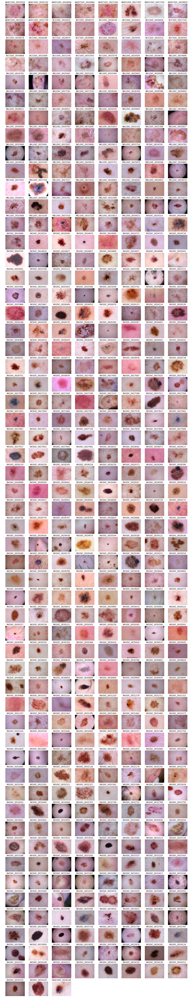

In [18]:
import os
import matplotlib.pyplot as plt
import PIL
%matplotlib inline
plt.figure(figsize=(20,200))
rows = 100

for num, x in enumerate(error_list):
    img = PIL.Image.open(test_dir + x)
    plt.subplot(rows,8,num+1)
    plt.title(x.split('.')[0])
    plt.axis('off')
    plt.imshow(img)